# Case Study: Transfer Learning For Food Classification

<img src="https://github.com/ijoseff/ijoseff.github.io/blob/master/assets/img/portfolio/transfer.png?raw=true" width = "800" height = "400" />

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Case-Study:-Transfer-Learning-For-Food-Classification" data-toc-modified-id="Case-Study:-Transfer-Learning-For-Food-Classification-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Case Study: Transfer Learning For Food Classification</a></span></li><li><span><a href="#Introduction" data-toc-modified-id="Introduction-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Review" data-toc-modified-id="Review-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Review</a></span></li><li><span><a href="#Libraries-And-Data-Importation" data-toc-modified-id="Libraries-And-Data-Importation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Libraries And Data Importation</a></span></li><li><span><a href="#Data-Visualization" data-toc-modified-id="Data-Visualization-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Data Visualization</a></span></li><li><span><a href="#Image-Augmentation" data-toc-modified-id="Image-Augmentation-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Image Augmentation</a></span></li><li><span><a href="#Deep-Transfer-Learning-(Inception-ResNetV2)" data-toc-modified-id="Deep-Transfer-Learning-(Inception-ResNetV2)-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Deep Transfer Learning (Inception ResNetV2)</a></span></li><li><span><a href="#Fine-Tuned-The-Trained-Model" data-toc-modified-id="Fine-Tuned-The-Trained-Model-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Fine Tuned The Trained Model</a></span></li><li><span><a href="#Model-Evaluation" data-toc-modified-id="Model-Evaluation-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Model Evaluation</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

# Introduction

In this project, a deep learning model will be train to predict the type of food and then fine tune the model to improve its performance. This project could practically applied in food industry to detect the type and quality of food.

[Calorie Mama AI](https://www.caloriemama.ai/#) is one of the leading players in food artificial intelligence sector and their software is able to extract nutrition-related information of the meal from the photo of the food.

**Problem:**
 - Food classification is a challenging problem due to the large number of food categories, since the visual similarity between different food categories is high. The goal is to build a model to predict the fine-grained food-category label given an image.

**Dataset:**
 - The dataset consist of 16643 color images belonging to 11 categories.
 - Categories that are present in the data are bread, diary product, dessert, egg, fried egg, meat, noodles-pasta, rice, seafood, soup and vegetable-fruit
 
**Source:** Kaggle Competition

# Review

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer1.png?raw=true" width = "800" height = "400" />

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer2.png?raw=true" width = "800" height = "400" />

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer3.png?raw=true" width = "800" height = "400" />

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer4.png?raw=true" width = "800" height = "400" />

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer5.png?raw=true" width = "800" height = "400" />

<img src="https://github.com/ijoseff/Transfer-Learning-Food-Classfication/blob/master/transfer6.png?raw=true" width = "800" height = "400" />

# Libraries And Data Importation

In [1]:
# Import the necessary packages
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [2]:
# Set directory
%cd C:\Users\Joseff\Desktop\Transfer Learning For Food Classification\food11

C:\Users\Joseff\Desktop\Transfer Learning For Food Classification\food11


In [3]:
# List all folders under training
os.listdir('./training')

['Bread',
 'Dairy product',
 'Dessert',
 'Egg',
 'Fried food',
 'Meat',
 'Noodles-Pasta',
 'Rice',
 'Seafood',
 'Soup',
 'Vegetable-Fruit']

In [4]:
# List all folders under validation
os.listdir('./validation')

['Bread',
 'Dairy product',
 'Dessert',
 'Egg',
 'Fried food',
 'Meat',
 'Noodles-Pasta',
 'Rice',
 'Seafood',
 'Soup',
 'Vegetable-Fruit']

In [5]:
# List all folders under evaluation
os.listdir('./evaluation')

['Bread',
 'Dairy product',
 'Dessert',
 'Egg',
 'Fried food',
 'Meat',
 'Noodles-Pasta',
 'Rice',
 'Seafood',
 'Soup',
 'Vegetable-Fruit']

In [6]:
# Check the number of images in training, validation and evaluation dataset
train = []
valid = []
test = []

# os.listdir returns the list of files in the folder, in this case image class names
for i in os.listdir('./training'):
    train.extend(os.listdir(os.path.join('training', i)))
    valid.extend(os.listdir(os.path.join('validation', i)))
    test.extend(os.listdir(os.path.join('evaluation', i)))

# Show the number of images
print('Number of train images: {} \nNumber of validation images: {} \nNumber of test images: {}'.format(len(train), len(valid), len(test)))

Number of train images: 9308 
Number of validation images: 3383 
Number of test images: 3180


In [7]:
# check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []
for i in os.listdir('./training'):
  Class_name.append(i)
  train_class = os.listdir(os.path.join('training',i))
  print('Number of images in {}={}\n'.format(i,len(train_class)))
  No_images_per_class.append(len(train_class))

Number of images in Bread=800

Number of images in Dairy product=394

Number of images in Dessert=1490

Number of images in Egg=986

Number of images in Fried food=847

Number of images in Meat=1318

Number of images in Noodles-Pasta=440

Number of images in Rice=277

Number of images in Seafood=853

Number of images in Soup=1500

Number of images in Vegetable-Fruit=403



In [8]:
# Check the number of images per class
No_images_per_class

[800, 394, 1490, 986, 847, 1318, 440, 277, 853, 1500, 403]

# Data Visualization

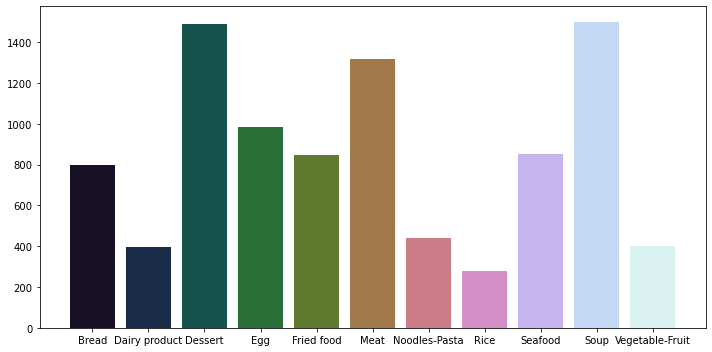

In [9]:
# Visualize the number of images in each class in the training dataset
fig = plt.figure(figsize=(10, 5))
plt.bar(Class_name, No_images_per_class, color = sns.color_palette("cubehelix", len(Class_name)))
fig.tight_layout()
plt.show()

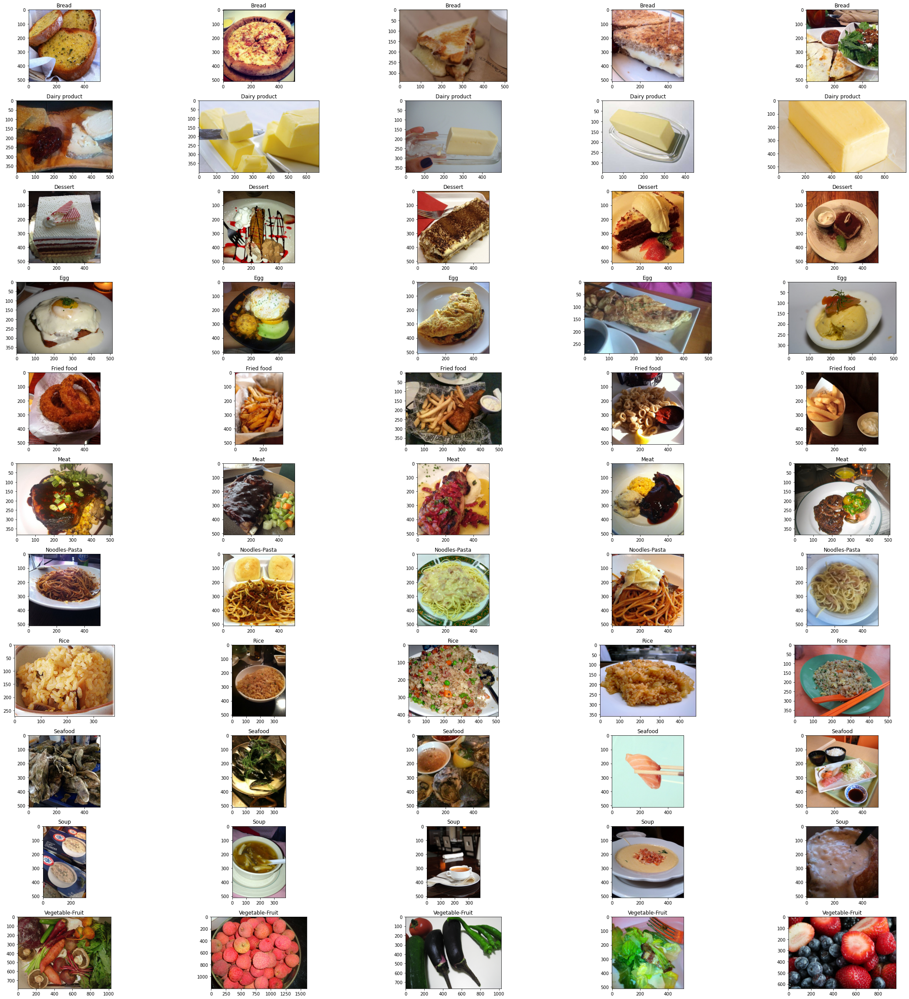

In [10]:
# Visualize the images in the dataset
fig, axs = plt.subplots(11, 5, figsize = (32,32))
count = 0

# For every class in the dataset
for i in os.listdir('./training'):
  # get the list of all images that belong to a particular class
  train_class = os.listdir(os.path.join('training', i))
  
  # Plot 5 images per class
  for j in range(5):
    img = os.path.join('training', i, train_class[j])
    axs[count][j].title.set_text(i)
    axs[count][j].imshow(PIL.Image.open(img))  
  count += 1

fig.tight_layout()
plt.show()

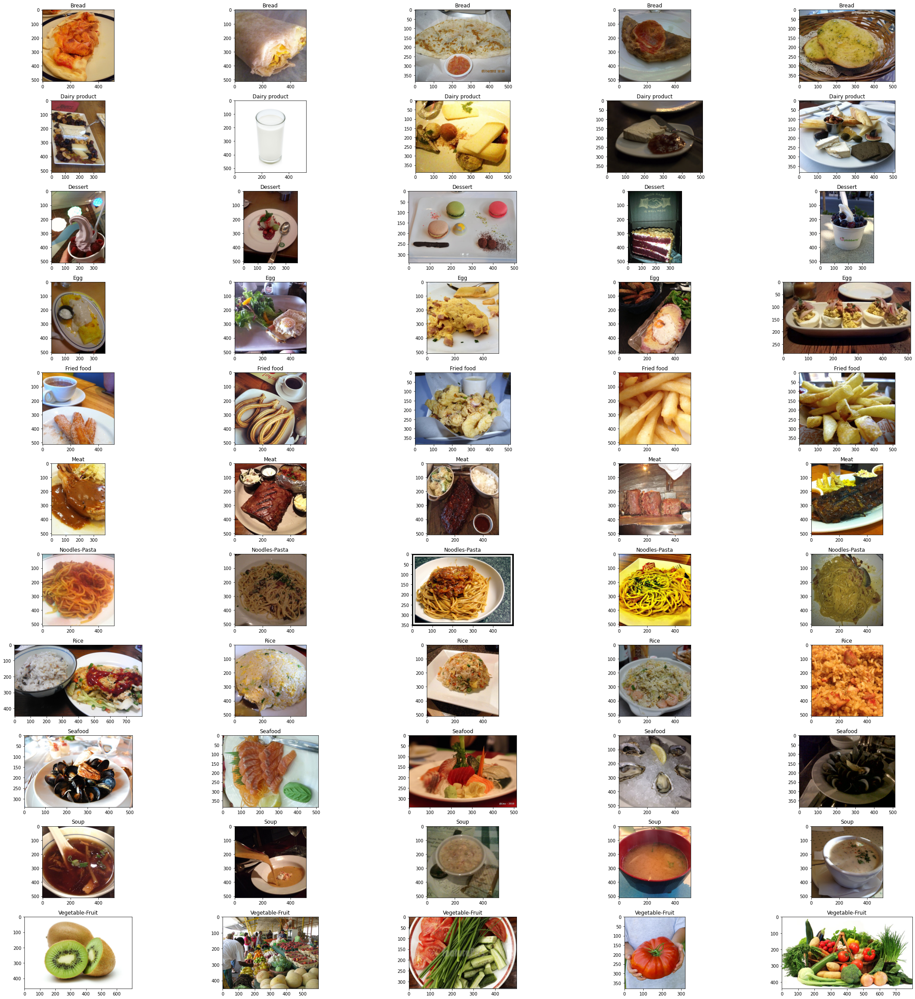

In [11]:
# Visualize the images in the validation dataset
fig, axes = plt.subplots(11,5, figsize=(32,32))
count = 0
for i in os.listdir('./validation'):
    
  # Get the list of images in the particualr class 
  validation_class = os.listdir(os.path.join('validation',i))
    
  # Plot 3 images per class
  for j in range(5):
    img = os.path.join('validation', i, validation_class[j])
    img = PIL.Image.open(img)
    axes[count][j].title.set_text(i)
    axes[count][j].imshow(img)  
  count += 1

fig.tight_layout()
plt.show()

# Image Augmentation

In [12]:
# Create run-time augmentation on training and test dataset
# For training datagenerator,  we add normalization, shear angle, zooming range and horizontal flip
train_datagen = ImageDataGenerator(
                rescale = 1./255,
                shear_range = 0.2,
                zoom_range = 0.2,
                horizontal_flip = True)


# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale=1./255)

In [13]:
# Create data generator for training dataset.
train_generator = train_datagen.flow_from_directory(
        'training',
        target_size = (256, 256),
        batch_size = 32,
        class_mode = 'categorical')

Found 9308 images belonging to 11 classes.


In [14]:
# Create data generator for validation dataset.
validation_generator = test_datagen.flow_from_directory(
        'validation',
        target_size = (256, 256),
        batch_size = 32,
        class_mode = 'categorical')

Found 3383 images belonging to 11 classes.


In [15]:
# Create data generator for test dataset.
test_generator = test_datagen.flow_from_directory(
        'evaluation',
        target_size = (256, 256),
        batch_size = 32,
        class_mode = 'categorical')

Found 3180 images belonging to 11 classes.


# Deep Transfer Learning (Inception ResNetV2)

In [16]:
# load the inception resnetv2 model
basemodel = InceptionResNetV2(weights = 'imagenet', include_top = False, input_tensor = Input(shape = (256, 256, 3)))

In [17]:
# Print the model summary
basemodel.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 127, 127, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 127, 127, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 127, 127, 32) 0           batch_normalization[0][0]        
________________________________________________________________________________

In [18]:
# Freeze the basemodel weights , so these weights won't change during training
basemodel.trainable = False

In [19]:
# Add classification head to the model
headmodel = basemodel.output

# Convolutional layer
headmodel = GlobalAveragePooling2D(name = 'global_average_pool')(headmodel)

# flattening layer
headmodel = Flatten(name = 'flatten')(headmodel)

# Dense layer
headmodel = Dense(256, activation = 'relu', name = 'dense_1')(headmodel)

# Dropout for regularization
headmodel = Dropout(0.3)(headmodel)

# Dense layer
headmodel = Dense(128, activation = 'relu', name = 'dense_2')(headmodel)

# Dropout for regularization
headmodel = Dropout(0.3)(headmodel)

# Last layer
headmodel = Dense(11, activation = 'softmax', name = 'dense_3')(headmodel)

# Model architecture
model = Model(inputs = basemodel.input, outputs = headmodel)

In [20]:
# Comple the model
model.compile(loss = 'categorical_crossentropy', optimizer = SGD(lr = 0.1, momentum = 0.9), metrics = ['accuracy'])

In [21]:
# # Using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
# earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# # Save the best model with lower validation loss
# checkpointer = ModelCheckpoint(filepath="weights.hdf5", verbose=1, save_best_only=True)

In [22]:
# This will take endless time to train, I already have pre-trained model for this
# # Fit the model
# history = model.fit(train_generator, steps_per_epoch = train_generator.n // 32, epochs = 1, validation_data = validation_generator, validation_steps = validation_generator.n // 32, callbacks = [checkpointer, earlystopping])

---

# Fine Tuned The Trained Model

In [23]:
# Unfreeze the weights in the base model, now these weights will be changed during training
basemodel.trainable = True

In [24]:
# Check model summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 127, 127, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 127, 127, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 127, 127, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [25]:
# Using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# Save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="weights_fine.hdf5", verbose=1, save_best_only=True)

In [26]:
# Compile the model
model.compile(loss = 'categorical_crossentropy', optimizer = SGD(lr = 0.0001, momentum = 0.9), metrics = ['accuracy'])

In [27]:
# This will take endless time to train, I already have pre-trained model for this
# # Fine tune the model with very low learning rate
# history = model.fit(train_generator, steps_per_epoch = train_generator.n // 32, epochs = 10, validation_data = validation_generator, validation_steps = validation_generator.n // 32, callbacks = [checkpointer, earlystopping])

# Model Evaluation

In [28]:
# Load a pretrained weight
model.load_weights('weights_fine.hdf5')

In [30]:
# Evaluate the performance of the model
evaluate = model.evaluate_generator(test_generator, steps = test_generator.n // 32, verbose =1)

# Show accuracy
print('Accuracy Test : {}'.format(evaluate[1]))

99/99 [==============================] - 2529s 26s/step - loss: 0.3532 - accuracy: 0.9015
Accuracy Test : 0.9015151262283325


In [31]:
# Assigning label names to the corresponding indexes
labels = {0:'Bread', 1: 'Dairy product', 2:'Dessert', 3:'Egg', 4:'Fried food', 5:'Meat', 6:'Noodles-Pasta', 7:'Rice', 8:'Seafood', 9:'Soup', 10:'Vegetable-Fruit'}

In [32]:
# Import library
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Creat list # Import cv2
prediction = []
original = []
image = []
count = 0

# loading images and their predictions 
for i in os.listdir('./evaluation'):
  for item in os.listdir(os.path.join('./evaluation',i)):
    
    # Code to open the image
    img= PIL.Image.open(os.path.join('./evaluation',i,item))
    
    # Resizing the image to (256,256)
    img = img.resize((256,256))
    
    # Appending image to the image list
    image.append(img)
    
    # Converting image to array
    img = np.asarray(img, dtype= np.float32)
    
    # Normalizing the image
    img = img / 255
    
    # Reshaping the image in to a 4D array
    img = img.reshape(-1,256,256,3)
    
    # Making prediction of the model
    predict = model.predict(img)
    
    # Getting the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    
    # Appending the predicted class to the list
    prediction.append(labels[predict])
    
    # Appending original class to the list
    original.append(i)


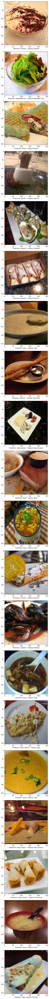

In [33]:
# Visualizing the results
import random
fig = plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20,1,i+1)
    plt.xlabel("Prediction -" + prediction[j] +"   Original -" + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [36]:
# Classification report
print(classification_report(np.asarray(original), np.array(prediction)))

                 precision    recall  f1-score   support

          Bread       0.80      0.92      0.86       203
  Dairy product       0.83      0.70      0.76       148
        Dessert       0.86      0.86      0.86       500
            Egg       0.91      0.87      0.89       335
     Fried food       0.93      0.89      0.91       287
           Meat       0.91      0.92      0.92       432
  Noodles-Pasta       1.00      0.99      0.99       147
           Rice       0.95      0.96      0.95        96
        Seafood       0.93      0.91      0.92       303
           Soup       0.97      0.97      0.97       499
Vegetable-Fruit       0.87      0.96      0.91       230

       accuracy                           0.91      3180
      macro avg       0.90      0.90      0.90      3180
   weighted avg       0.91      0.91      0.91      3180



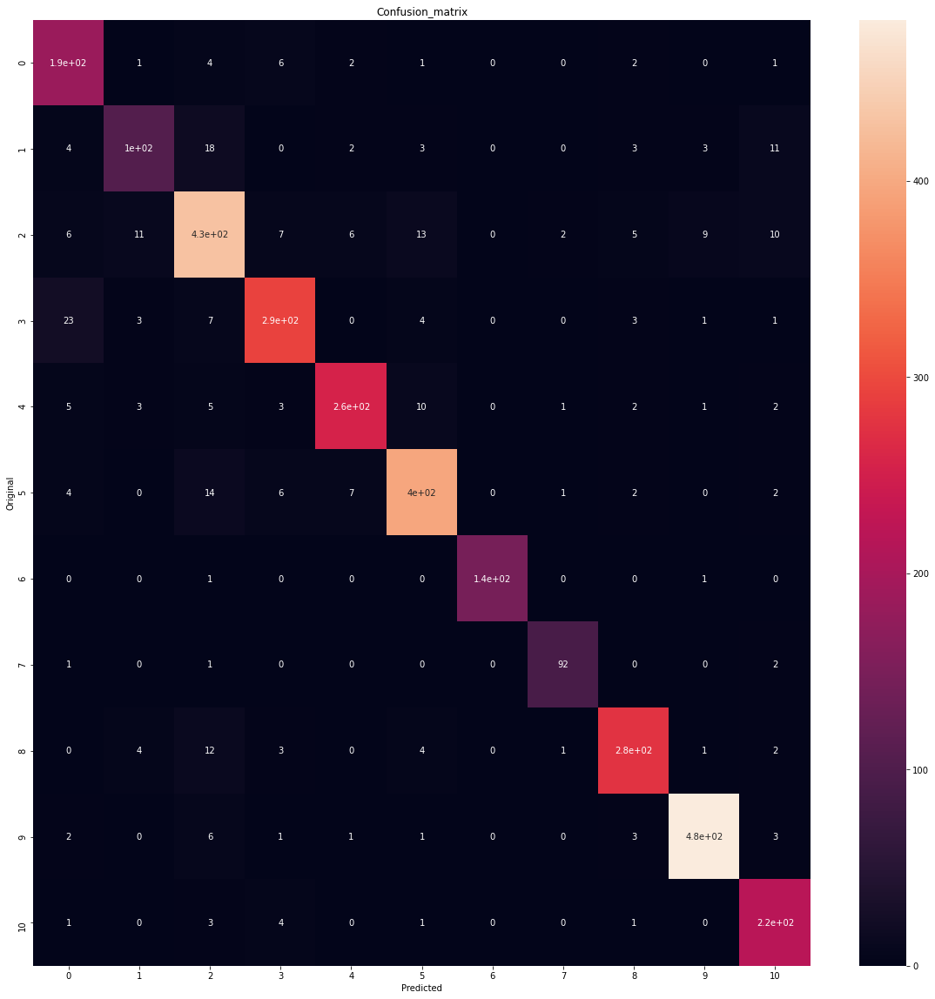

In [38]:
# Plot confusion matrix
plt.figure(figsize=(20,20))
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax)

# Plot label
ax.set_xlabel('Predicted')
ax.set_ylabel('Original')
ax.set_title('Confusion_matrix')
plt.show()

# Conclusion

The Inception-ResNet-v2 architecture is more accurate than previous state of the art models. Although this architecture obtained a really good accurate score, it has about 54 millions trainable parameter which may take up a really long time to finish the model training. For improvement, the Xception Model can also be use as pre-trained weights. Xception model can be used for prediction, feature extraction, and fine-tuning, with a 22,910,480 trainable parameters with 95% top accuracy.